## Vehicle Detection and Tracking

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import glob
import cv2

from feature_preprocessing import *

<Figure size 1008x432 with 0 Axes>

In [2]:
def demo_feature_extractors(file_path):
    
    image = cv2.imread(file_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    features = color_hist(image, nbins=32, bins_range=(0, 256))
    # Plot features
    plt.title('Spatially Binned Features')
    plt.plot(features)
    plt.show()
    plt.close()
    
    
    hist_features = bin_spatial(image, size=(32, 32))

    # Read in the image
    # image = mpimg.imread(car_images[ind])
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    pix_per_cell = 8
    cell_per_block = 2
    orient = 9
    # Call our function with vis=True to see an image output
    features, hog_image = get_hog_features(gray, orient, pix_per_cell, cell_per_block, vis=True, feature_vec=True)

    # Plot the examples
    fig = plt.figure()
    plt.subplot(121)
    plt.imshow(image, cmap='gray')
    plt.title('Example Image')
    plt.subplot(122)
    plt.imshow(hog_image, cmap='gray')
    plt.title('HOG Visualization')
    plt.show()
    plt.close()


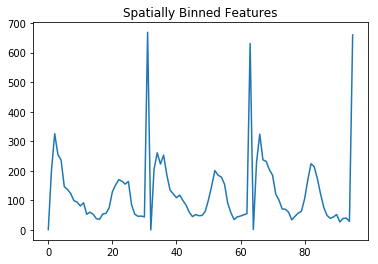

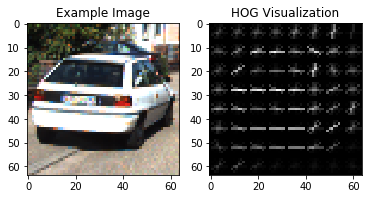

In [3]:
demo_feature_extractors("./examples/car-kitti-17.png")

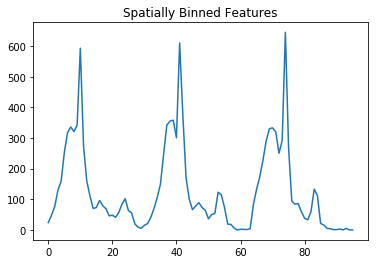

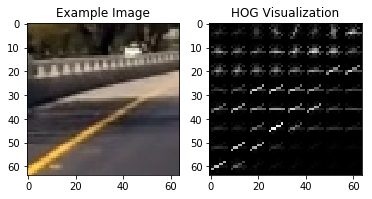

In [4]:
demo_feature_extractors("./examples/not-car-extra40.png")

### Loading Datasets

In [5]:
cars = glob.glob("./data/vehicles/*/*.png")
notcars = glob.glob("./data/non-vehicles/*/*.png")

print("Vehicle dataset size: ", len(cars))
print("Non Vehicle dataset size: ", len(notcars))

# Both classes have relatively similar number of examples, hence no augmentation is required.

Vehicle dataset size:  8792
Non Vehicle dataset size:  8968


In [6]:
import pickle
import os

color_space = 'LUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 8  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 0 # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

USE_EXISTING_FEATURES = False

if USE_EXISTING_FEATURES:
    with open("./data/learned_features/car_features.pickle", "rb") as handle:
        car_features = pickle.load(handle)
    with open("./data/learned_features/notcar_features.pickle", "rb") as handle:
        notcar_features = pickle.load(handle)
    
else:

    car_features = extract_features(cars, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)

    notcar_features = extract_features(notcars, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)


    with open("./data/learned_features/car_features.pickle", 'wb') as handle:
        pickle.dump(car_features, handle, protocol=pickle.HIGHEST_PROTOCOL)

    with open("./data/learned_features/notcar_features.pickle", 'wb') as handle:
        pickle.dump(notcar_features, handle, protocol=pickle.HIGHEST_PROTOCOL)   
    
os.system("spd-say 'Features loaded!'")
print("len---car_features:    ", len(car_features))
print("len---notcar_features: ", len(notcar_features))

len---car_features:     17584
len---notcar_features:  17936


### Support Vector Classifier

In [7]:
import time
import os
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Create an array stack of feature vectors
# StandardScaler() expects np.float64
X = np.vstack((car_features, notcar_features)).astype(np.float64)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
# rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=23)
    
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X_train)
# Apply the scaler to X
X_train = X_scaler.transform(X_train)
X_test = X_scaler.transform(X_test)

print('Using: ', orient, '   orientations: ', pix_per_cell,
      '  pixels per cell and  ', cell_per_block, '  cells per block')

print('Feature vector length:', len(X_train[0]))

# Use a linear SVC 
svc = LinearSVC(C = 0.001) # c = 0.0001 --> 0.9887
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()

print(round(t2-t, 2), 'Seconds to train SVC...')

# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

# Check the prediction time for a single sample
t=time.time()

os.system("spd-say 'Model trained!'")

with open("./data/learned_model/svc.pickle", 'wb') as handle:
    pickle.dump(svc, handle, protocol=pickle.HIGHEST_PROTOCOL)

"""
Using:  8    orientations:  8   pixels per cell and   2   cells per block
Feature vector length: 2432
5.07 Seconds to train SVC...
Test Accuracy of SVC =  0.9893
"""
    

Using:  8    orientations:  8   pixels per cell and   2   cells per block
Feature vector length: 2432
3.18 Seconds to train SVC...
Test Accuracy of SVC =  0.9886


'\nUsing:  8    orientations:  8   pixels per cell and   2   cells per block\nFeature vector length: 2432\n5.07 Seconds to train SVC...\nTest Accuracy of SVC =  0.9893\n'

### Sliding Window


windows_x = 1 + (image_width - window_width)/(window_width * overlap_proportion)
<br/>
windows_y = 1 + (image_height - window_height)/(window_height * overlap_proportion)
<br/>
total_windows = windows_x * windows_y

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


pygame 1.9.4
Hello from the pygame community. https://www.pygame.org/contribute.html
Image Dimensions:  (720, 1280, 3)
Total windows:  57


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


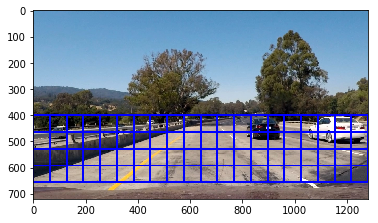

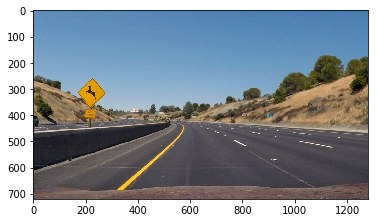

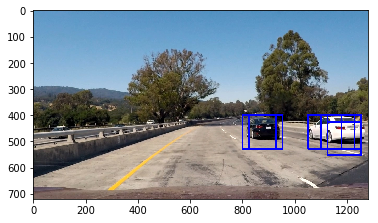

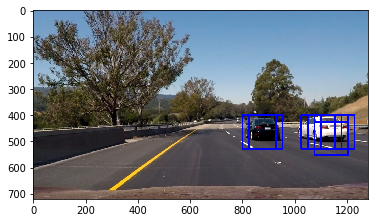

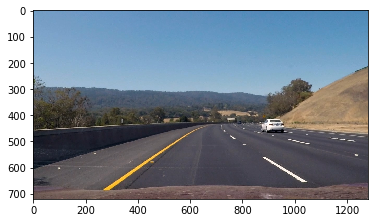

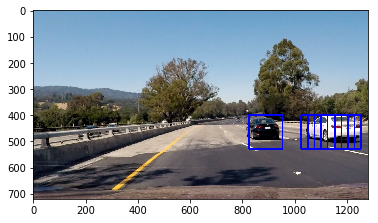

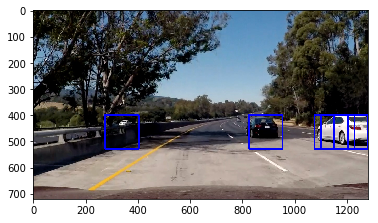

In [8]:
# file_name = "./data/test_images/test1.jpg"

from utils import *

image = cv2.imread("./data/test_images/test1.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = image.astype(np.float32)/255
print("Image Dimensions: ", image.shape)

x_start_stop = [None, None]
y_start_stop = [400, 656] # Min and max in y to search in slide_window()
xy_window = (128, 128)
xy_overlap = (0.5, 0.5)

windows = slide_window(image,
                       x_start_stop=x_start_stop,
                       y_start_stop=y_start_stop,
                       xy_window=xy_window,
                       xy_overlap=xy_overlap)
print("Total windows: ", len(windows))
window_img = draw_boxes(image, windows, color=(0, 0, 255), thick=6)                    
plt.imshow(window_img)


for file_name in glob.glob("./data/test_images/*.jpg"):
#for file_name in glob.glob("./data/error/*.png"):
    image = cv2.imread(file_name)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    """
    We have trained our SVC model on png images scaled from 0 to 1
    while jpg are scaled from 0 to 256 
    """
    image = image.astype(np.float32)/255.0

    windows = slide_window(image, x_start_stop=[None, None],
                           y_start_stop=y_start_stop,
                           xy_window=(128, 128), xy_overlap=(0.80, 0.80))

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                      

    draw_image = np.copy(image)
    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

    plt.figure()
    plt.imshow(window_img)

Scale:  1.2 	|  boxes-detected:  0
Scale:  1.35 	|  boxes-detected:  0
Scale:  1.75 	|  boxes-detected:  0
Scale:  2.0 	|  boxes-detected:  0
Scale:  2.25 	|  boxes-detected:  0
Scale:  2.65 	|  boxes-detected:  0
Scale:  3.0 	|  boxes-detected:  0
Scale:  3.5 	|  boxes-detected:  0
Scale:  4.0 	|  boxes-detected:  0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  1.2 	|  boxes-detected:  27


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  1.35 	|  boxes-detected:  22
Scale:  1.75 	|  boxes-detected:  8


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  2.0 	|  boxes-detected:  7
Scale:  2.25 	|  boxes-detected:  4
Scale:  2.65 	|  boxes-detected:  3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  3.0 	|  boxes-detected:  1
Scale:  3.5 	|  boxes-detected:  0
Scale:  4.0 	|  boxes-detected:  0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  1.2 	|  boxes-detected:  17


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  1.35 	|  boxes-detected:  16
Scale:  1.75 	|  boxes-detected:  10


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  2.0 	|  boxes-detected:  8
Scale:  2.25 	|  boxes-detected:  4
Scale:  2.65 	|  boxes-detected:  3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  3.0 	|  boxes-detected:  1
Scale:  3.5 	|  boxes-detected:  0
Scale:  4.0 	|  boxes-detected:  0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  1.2 	|  boxes-detected:  5


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  1.35 	|  boxes-detected:  1
Scale:  1.75 	|  boxes-detected:  0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  2.0 	|  boxes-detected:  2
Scale:  2.25 	|  boxes-detected:  0
Scale:  2.65 	|  boxes-detected:  0
Scale:  3.0 	|  boxes-detected:  2
Scale:  3.5 	|  boxes-detected:  0
Scale:  4.0 	|  boxes-detected:  0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  1.2 	|  boxes-detected:  30


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  1.35 	|  boxes-detected:  22
Scale:  1.75 	|  boxes-detected:  10


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  2.0 	|  boxes-detected:  9
Scale:  2.25 	|  boxes-detected:  4
Scale:  2.65 	|  boxes-detected:  3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  3.0 	|  boxes-detected:  1
Scale:  3.5 	|  boxes-detected:  0
Scale:  4.0 	|  boxes-detected:  0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  1.2 	|  boxes-detected:  14


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  1.35 	|  boxes-detected:  16
Scale:  1.75 	|  boxes-detected:  9


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  2.0 	|  boxes-detected:  6
Scale:  2.25 	|  boxes-detected:  5
Scale:  2.65 	|  boxes-detected:  3
Scale:  3.0 	|  boxes-detected:  1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Scale:  3.5 	|  boxes-detected:  1
Scale:  4.0 	|  boxes-detected:  0


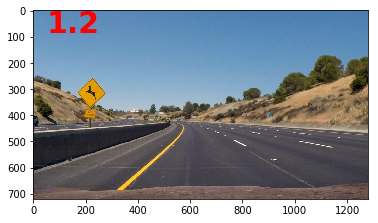

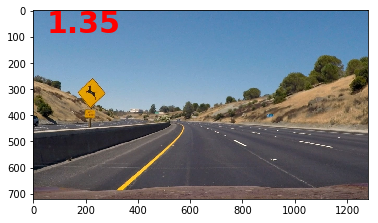

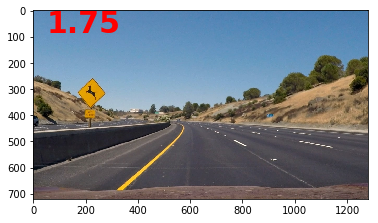

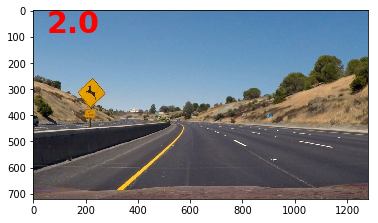

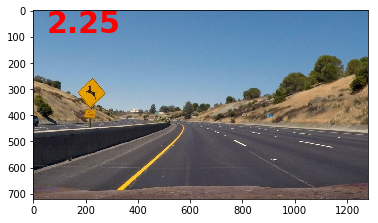

...

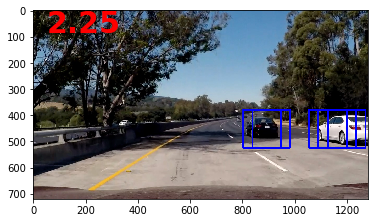

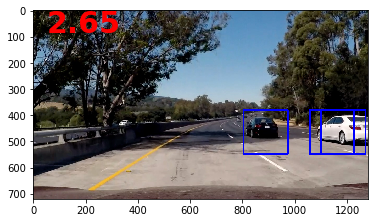

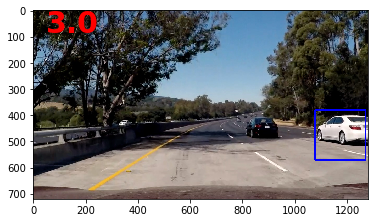

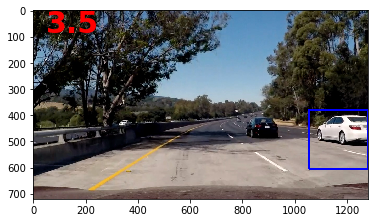

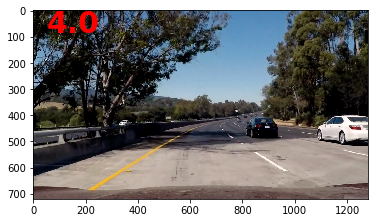

In [9]:
from utils import *
from feature_preprocessing import *

def get_multi_scale_bounding_boxes(image, visualize = False):
    box_list = []
    for scale in [1.20, 1.35, 1.75, 2.0, 2.25, 2.65, 3.0, 3.5, 4.0]:
        boxes, out_img = find_cars(image, 380, 700, 550, 1280, scale, svc, X_scaler, orient,
                                   pix_per_cell, cell_per_block, spatial_size, hist_bins, 2, visualize = visualize)
        box_list += boxes
        if visualize:
            print("Scale: ", scale, "\t|  boxes-detected: ", len(boxes))
            plt.figure()
            plt.text(50, 50, str(scale), color="red", fontdict = {
                "fontsize": 30,
                "fontweight":'bold',
                "ha":"left",
                "va":"center"
            })
            plt.imshow(out_img)
    return box_list
    

for file_name in glob.glob("./data/test_images/*.jpg"):
#for file_name in glob.glob("./data/test_images/test4.jpg"):
#for file_name in glob.glob("./data/error/*.png"):
    image = cv2.imread(file_name)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    """
    We have trained our SVC model on png images scaled from 0 to 1
    while jpg are scaled from 0 to 255
    """
    image = image.astype(np.float32)/255.0
    box_list = get_multi_scale_bounding_boxes(image, visualize = True)


### Multiple Detections & False Positives

We would be creating a heat-map from bounding box detections in order to combine overlapping detections and remove false positives.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


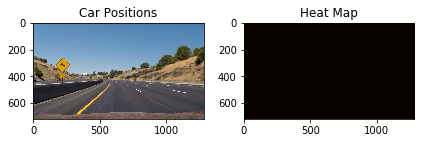

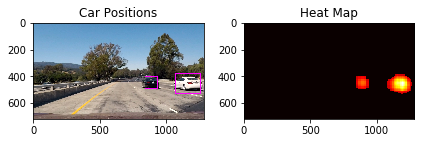

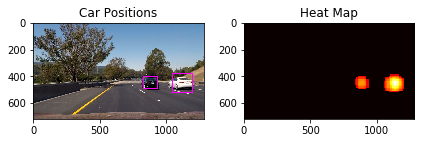

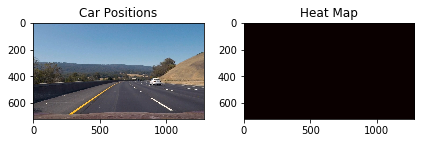

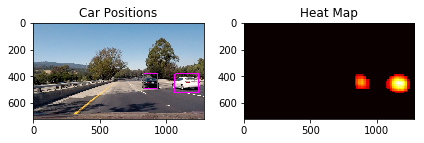

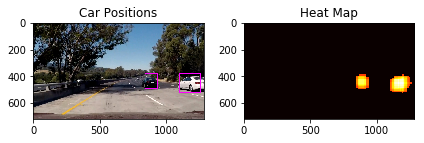

In [10]:
from scipy.ndimage.measurements import label

def draw_bounding_box_using_heatmap(image, box_list, heatmap_history, visualize = False):
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat, box_list)
    threshold = 10.0
    
    if heatmap_history is not None:
        heatmap_history.append(heat)
        heat = sum(heatmap_history)
        max_heat = np.amax(heat)
        threshold = 0.6 * max_heat # (atleast 60% of over last 12 frames)
        if threshold < 10.0:
            threshold = 10.0
    
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat, threshold)
    
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)
    
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)

    if visualize:
        fig = plt.figure()
        plt.subplot(121)
        plt.imshow(draw_img)
        plt.title('Car Positions')
        plt.subplot(122)
        plt.imshow(heatmap, cmap='hot')
        plt.title('Heat Map')
        fig.tight_layout()
    
    return draw_img
        
for file_name in glob.glob("./data/test_images/*.jpg"):
    image = cv2.imread(file_name)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = image.astype(np.float32)/255.0
    box_list = get_multi_scale_bounding_boxes(image, visualize = False)
    draw_img = draw_bounding_box_using_heatmap(image, box_list, None, visualize = True)
    

In [11]:
from utils import *

input_file = "./data/videos/project_video.mp4"
#input_file = "./data/videos/project_video_clipped_16_32.mp4"
#input_file = "./data/videos/test_video.mp4"

output_file = "./output/videos/project_video.mp4"
#output_file = "./output/videos/project_video_clipped_16_32.mp4"
#output_file = "./output/videos/test_video.mp4"

#save_video_subclip("./data/videos/project_video.mp4", 16.00, 32.00, input_file)

In [12]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [13]:
from collections import deque

heatmap_history = deque(maxlen = 12)

def process_video_frame(image):
    image = image.astype(np.float32)/255.0
    box_list = get_multi_scale_bounding_boxes(image, visualize = False)
    draw_img = draw_bounding_box_using_heatmap(image, box_list, heatmap_history, visualize = False)
    return (draw_img * 255.0).astype(np.uint8)

In [14]:
video = VideoFileClip(input_file)
output = video.fl_image(process_video_frame)

%time output.write_videofile(output_file, audio=False)

os.system("spd-say 'Video generated!'")

[MoviePy] >>>> Building video ./output/videos/project_video.mp4
[MoviePy] Writing video ./output/videos/project_video.mp4


100%|█████████▉| 1260/1261 [18:26<00:00,  1.14it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output/videos/project_video.mp4 

CPU times: user 30min 29s, sys: 8min 3s, total: 38min 33s
Wall time: 18min 26s


0

In [15]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_file))